In [1]:
import xarray as xr
import numpy as np
import pandas as pd
%matplotlib inline
from matplotlib import pyplot as plt
from dask.diagnostics import ProgressBar
import seaborn as sns
from matplotlib.colors import LogNorm

## We only need the reduction opertor for inference

In [2]:
# resampling frequency in number of days
freq=2

             time        id        lat        lon       temp         ve  \
0      2002-07-04     10206  16.229625  66.330375        NaN  13.064500   
1      2002-07-04     10208  13.891875  69.552375        NaN   8.505125   
2      2002-07-04     11089  16.354375  64.683750  27.954125  12.168000   
3      2002-07-04     15703  13.903250  69.583125  28.552250   8.685875   
4      2002-07-04     27069  20.169750  68.737500  29.012000  26.958750   
5      2002-07-04     28842  18.878875  60.694625  27.701750  10.499125   
6      2002-07-04     34159  12.548125  58.914250        NaN  27.354250   
7      2002-07-04     34210   6.476750  56.925000  26.694875  -9.666750   
8      2002-07-04     34211   8.602375  67.929125  28.278000  20.618125   
9      2002-07-04     34212   6.232000  64.750250  28.470750  14.641875   
10     2002-07-04     34708  10.167500  59.691500  27.185500  47.792000   
11     2002-07-04     34710  12.933625  49.905250  30.910625 -34.754625   
12     2002-07-04     347

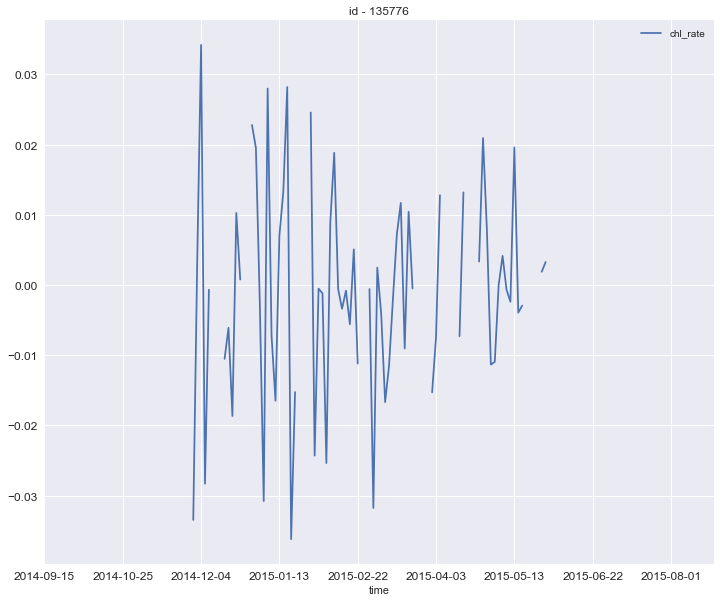

In [3]:
# load preprocessed float data, and start the interpolation right here!!!!
var7 = "chlrateweekno"
var6 = "sst4"
var5 = "par"
var4 = "t865"
var3 = "kd490"
var2 = "cdm"
var1 = "chl"
vardist = "dist"

indir_prefix = "../data_collector_globcolour/output.data.interpolate/2017GDPfloat/" + "df_Globcolor_"
indir = indir_prefix + var1 + vardist + var2 + var3 + var4 + var5 + var6 + var7 + "_" + str(freq) + "d.csv"

floatDF_tmp = pd.read_csv(indir,index_col=0)
print(floatDF_tmp)


### plot for id 125776, which will be fit by LDS
#plt.figure(figsize=(10,12))
floatDF_tmp[floatDF_tmp.id == 135776].plot(x='time', y ='chl_rate', title=('id - %d' % 135776), figsize=(12,10), fontsize=12 )
plt.show();
plt.close("all")

In [4]:
# https://stackoverflow.com/questions/16780014/import-file-from-parent-directory
# https://stackoverflow.com/questions/16771894/python-nameerror-global-name-file-is-not-defined
import os, sys
sys.path.append(os.path.dirname(os.path.dirname(os.path.abspath("__file__"))))

from tools import chl_rates  # del(chl_rates)
import importlib
importlib.reload(chl_rates)

<module 'tools.chl_rates' from '/Users/vyan2000/work_linux/2Archive/myproject/20161024xray_oceancolor/ocean_color-master/tools/chl_rates.py'>

In [5]:
print("\n ******* Reduce the Dataset to 'Nov-01 to Mar-31' ******* \n" )
floatsDF_NovMar = chl_rates.reduce_to_NovMar(floatDF_tmp)

# necessary for modification
floatsDF_NovMar.id = floatsDF_NovMar.id.astype(float)

floatsDF_NovMar


 ******* Reduce the Dataset to 'Nov-01 to Mar-31' ******* 

all the data count in [11-01, 03-31]  is  (3932,)


,time,id,lat,lon,temp,ve,vn,spd,var_lat,var_lon,...,sst4,chlor_a_log_e,chl_rate,chl_log_e_rate,chl_rate_week,chl_log_e_rate_week,chl_rate_stand,chl_log_e_rate_stand,week,week_rotate
907,2002-11-01,10206.0,10.737250,67.512250,NaN,-4.832250,6.374250,9.069875,0.000272,0.000719,...,29.292499,-1.921645,-0.005333,-0.035171,-0.037333,-0.246199,-0.011023,-0.138664,44,1
908,2002-11-01,11089.0,14.163375,65.330375,29.059750,-9.491125,6.442875,13.878500,0.000057,0.000106,...,28.683749,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44,1
909,2002-11-01,15707.0,14.197250,68.405375,NaN,-22.495125,1.167000,22.872625,0.000071,0.000140,...,29.338992,-1.861949,NaN,NaN,NaN,NaN,NaN,NaN,44,1
910,2002-11-01,34315.0,6.824250,58.284375,29.299375,11.405750,-34.943250,39.244250,0.000045,0.000081,...,28.621874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44,1
911,2002-11-01,34710.0,16.764500,63.115250,29.013125,0.536625,14.745500,15.588375,0.000062,0.000119,...,27.504999,-0.967747,0.023261,0.065307,0.162824,0.457150,0.019548,0.369692,44,1
912,2002-11-01,34721.0,12.577000,67.553000,29.335125,1.065000,7.905750,10.247000,0.000066,0.000125,...,29.138749,-1.702484,0.020277,0.125864,0.141940,0.881048,0.016359,0.676070,44,1
913,2002-11-03,10206.0,10.818500,67.399375,NaN,-8.207500,7.311375,12.395125,0.000295,0.000778,...,28.825901,-2.134598,-0.014037,-0.106476,-0.098258,-0.745333,-0.020329,-0.499421,44,1
914,2002-11-03,11089.0,14.247750,65.189625,28.986625,-9.065625,4.137875,12.149875,0.000060,0.000116,...,28.817188,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44,1
915,2002-11-03,15707.0,14.162000,68.048125,NaN,-21.659125,-5.021500,22.922125,0.000074,0.000144,...,28.937047,-1.890368,-0.002177,-0.014210,-0.015237,-0.099467,-0.007648,-0.032612,44,1
916,2002-11-03,34315.0,6.310750,58.277125,29.485250,-7.001500,-29.505125,30.616000,0.000054,0.000099,...,28.617658,-2.041916,NaN,NaN,NaN,NaN,NaN,NaN,44,1


In [6]:
# check the float data [done]
# think about the data structure...

In [7]:
# check nan values in the spatial-temporal info
print("---------------------------------------")
print("sampling freq: "+ str(freq) + "D")
print("length of series: ", len(floatsDF_NovMar.chlor_a))
print("---------------------------------------")
cols = floatsDF_NovMar.columns.values
for col in cols:
    print("count of nans in " + col + ":" + str(floatsDF_NovMar[col].isnull().sum()) )

---------------------------------------
sampling freq: 2D
length of series:  5903
---------------------------------------
count of nans in time:0
count of nans in id:0
count of nans in lat:0
count of nans in lon:0
count of nans in temp:315
count of nans in ve:39
count of nans in vn:39
count of nans in spd:39
count of nans in var_lat:0
count of nans in var_lon:0
count of nans in var_tmp:0
count of nans in chlor_a:1240
count of nans in dist:0
count of nans in cdm:1601
count of nans in kd490:1268
count of nans in t865:1274
count of nans in par:1
count of nans in sst4:195
count of nans in chlor_a_log_e:1240
count of nans in chl_rate:1971
count of nans in chl_log_e_rate:1971
count of nans in chl_rate_week:1971
count of nans in chl_log_e_rate_week:1971
count of nans in chl_rate_stand:1971
count of nans in chl_log_e_rate_stand:1971
count of nans in week:0
count of nans in week_rotate:0


the floats' ids during November-March are: 
 ---------- 
 [  1.02060000e+04   1.10890000e+04   1.57070000e+04   3.43150000e+04
   3.47100000e+04   3.47210000e+04   3.47090000e+04   2.71390000e+04
   3.65300000e+04   3.42230000e+04   3.43740000e+04   4.37440000e+04
   4.37460000e+04   4.37480000e+04   4.39950000e+04   5.33630000e+04
   5.33650000e+04   5.33660000e+04   5.33670000e+04   4.64720000e+04
   5.43710000e+04   5.33520000e+04   5.79390000e+04   5.79400000e+04
   5.93710000e+04   5.93720000e+04   5.93730000e+04   4.35980000e+04
   6.22010000e+04   6.22020000e+04   6.25560000e+04   6.25570000e+04
   6.25580000e+04   6.25550000e+04   6.21980000e+04   6.30360000e+04
   6.21950000e+04   6.21930000e+04   6.25530000e+04   5.93650000e+04
   5.93670000e+04   7.06970000e+04   7.06990000e+04   5.93630000e+04
   7.06950000e+04   6.30680000e+04   6.30690000e+04   6.30710000e+04
   6.30740000e+04   6.30750000e+04   6.30760000e+04   6.39280000e+04
   6.39290000e+04   6.39350000e+04   6.393000

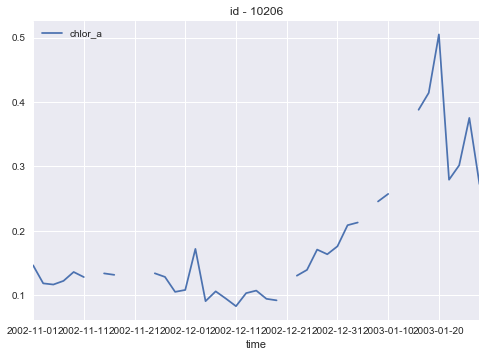

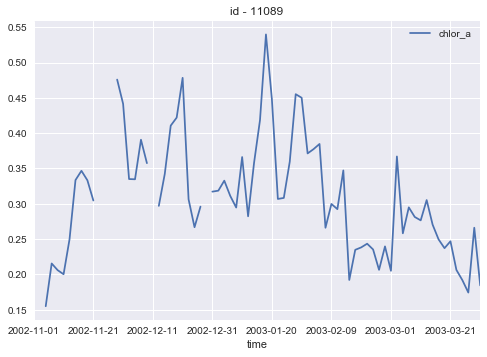

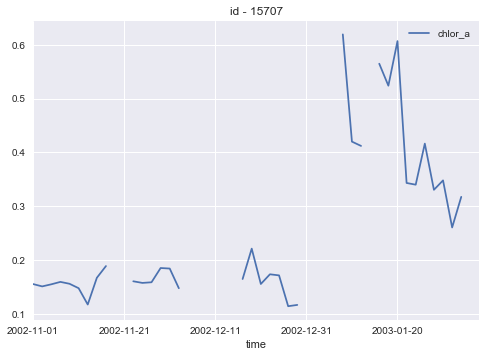

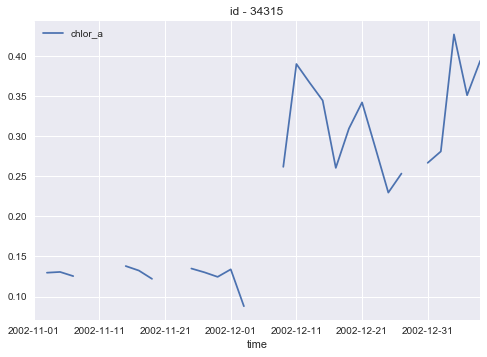

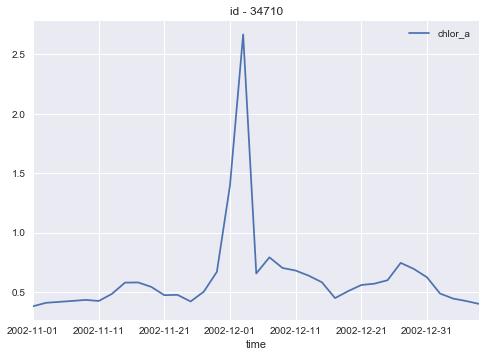

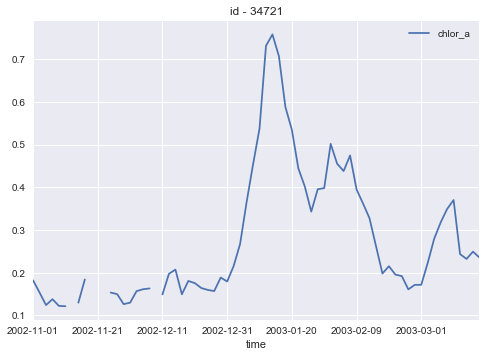

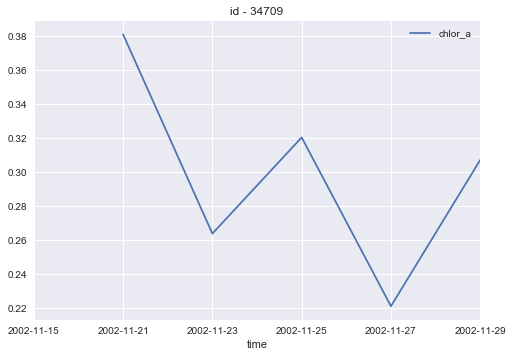

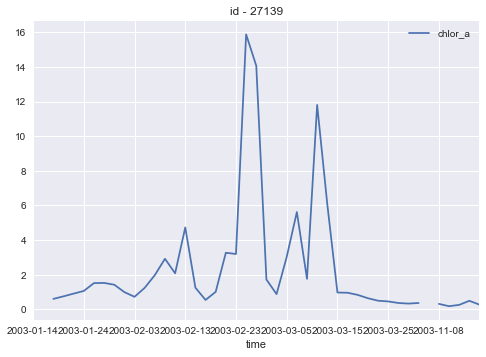

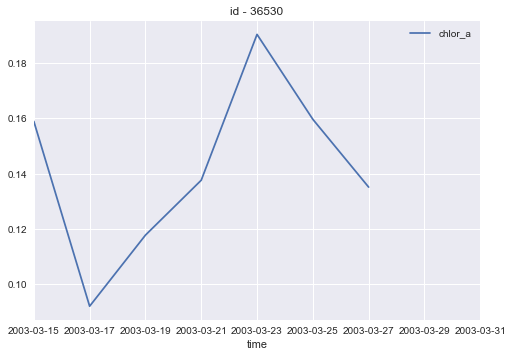

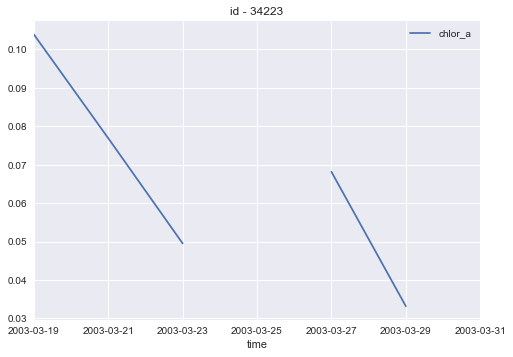

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.0, right=0.0
  'left=%s, right=%s') % (left, right))


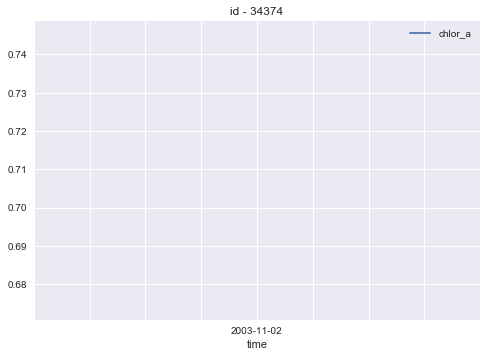

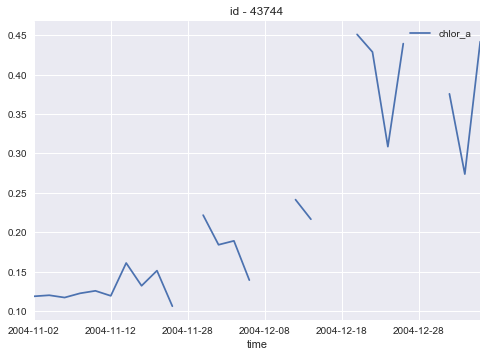

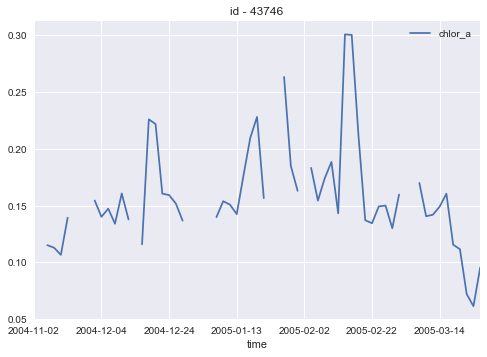

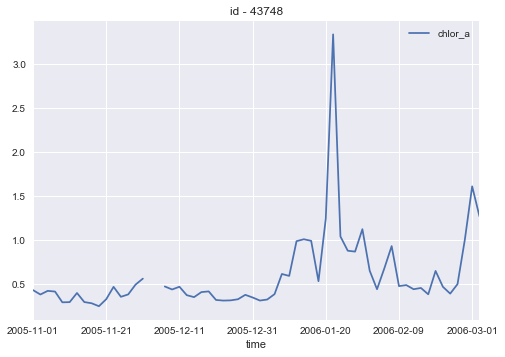

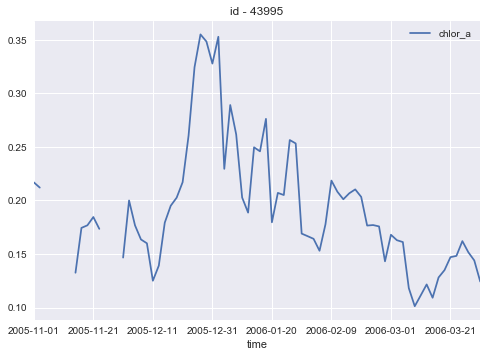

...

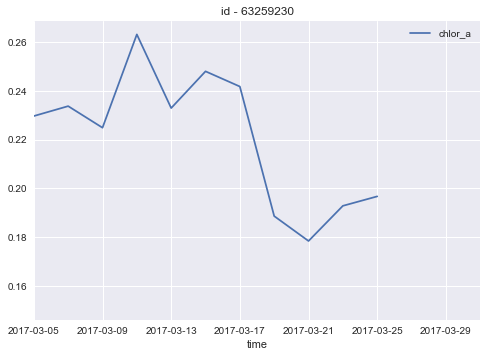

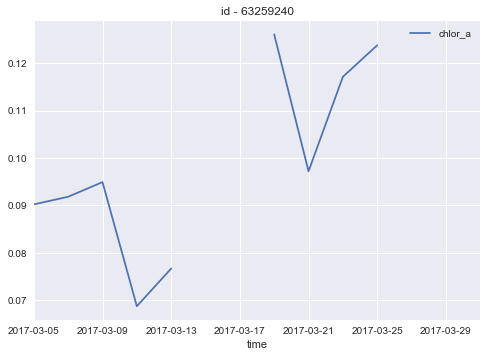

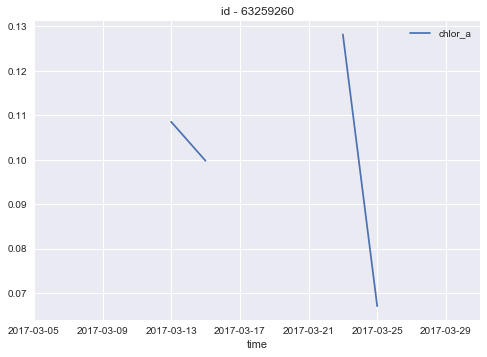

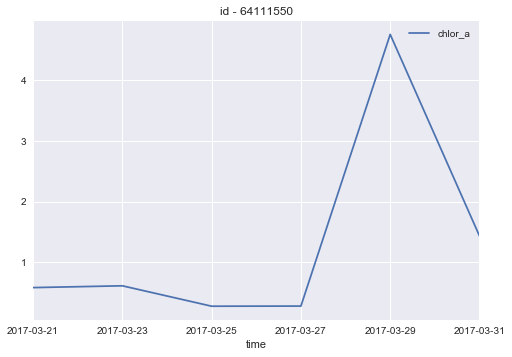

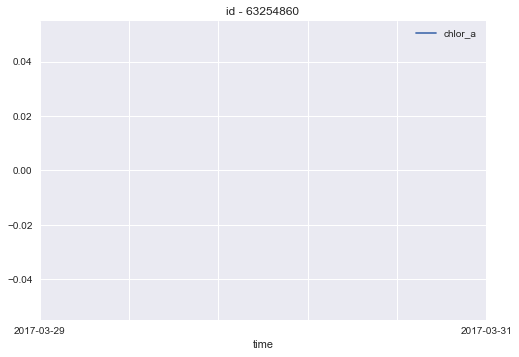

In [8]:
# plot the longevity of the typical floats
# @ref: data_coverage_LDS_modeling/data_coverage_2D_interp_LDS_chlorgithub.ipynb
id_set = floatsDF_NovMar.id.unique()
print("the floats' ids during November-March are: \n ---------- \n", id_set)

### chl-a plots for each float ###
print("\n ------ chl-a plots for each float ------ \n")
plt.figure(figsize=(8,6))
for i in id_set:
    floatsDF_NovMar[floatsDF_NovMar.id == i].plot(x='time', y ='chlor_a', title=('id - %d' % i) )
    plt.show();
    
plt.close("all")


In [401]:
''' the .loc !!!!!
mask = (floatsDF_NovMar.id == 27139)
floatsDF_NovMar.loc[mask,'id'] =  floatsDF_NovMar.loc[mask,'id']+0.5
floatsDF_NovMar[floatsDF_NovMar.id ==27139.5]
'''

,time,id,lat,lon,temp,ve,vn,spd,var_lat,var_lon,...,sst4,chlor_a_log_e,chl_rate,chl_log_e_rate,chl_rate_week,chl_log_e_rate_week,chl_rate_stand,chl_log_e_rate_stand,week,week_rotate
1134,2003-01-14,27139.5,22.417000,62.367000,24.957000,NaN,NaN,NaN,0.000125,0.000266,...,24.164690,0.432273,NaN,NaN,NaN,NaN,NaN,NaN,3,13
1139,2003-01-16,27139.5,22.139875,62.372000,24.906625,-9.014250,-31.650125,35.948000,0.000070,0.000132,...,24.114304,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,13
1144,2003-01-18,27139.5,21.724375,61.937500,24.969625,-38.863375,-18.454750,44.124000,0.000076,0.000148,...,24.312990,-0.509177,NaN,NaN,NaN,NaN,NaN,NaN,3,13
1149,2003-01-20,27139.5,21.598375,61.027125,25.142000,-62.931375,3.553875,63.582125,0.000064,0.000124,...,23.323134,-0.288075,0.074358,0.110551,0.520506,0.773860,0.074181,0.598598,4,14
1154,2003-01-22,27139.5,21.720625,60.176375,25.071875,-33.343375,2.043375,35.079250,0.000068,0.000132,...,23.989075,-0.097728,0.078595,0.095173,0.550164,0.666213,0.078711,0.520795,4,14
1159,2003-01-24,27139.5,21.598250,59.851250,25.016125,-15.175125,-14.503125,21.448125,0.000066,0.000122,...,23.956607,0.058619,0.076738,0.078174,0.537166,0.547216,0.076725,0.434788,4,14
1164,2003-01-26,27139.5,21.189000,59.590875,25.175750,-10.136750,-36.525625,38.822000,0.000110,0.000238,...,24.227811,0.414439,0.226575,0.177910,1.586025,1.245369,0.236928,0.939388,4,14
1169,2003-01-28,27139.5,20.691000,59.599375,25.059750,0.409500,-22.570125,24.534250,0.000265,0.000704,...,22.830950,0.421703,0.005517,0.003632,0.038618,0.025423,0.000577,0.057655,5,15
1173,2003-01-30,27139.5,20.358000,59.467875,25.045000,-12.887750,-24.344625,28.022000,0.000096,0.000197,...,23.835721,0.351475,-0.051696,-0.035114,-0.361875,-0.245796,-0.060594,-0.138373,5,15
1177,2003-02-01,27139.5,19.944500,59.220375,25.029125,-12.602375,-28.473625,31.418250,0.000098,0.000200,...,23.814299,-0.006774,-0.213956,-0.179124,-1.497695,-1.253870,-0.234079,-0.866973,5,15


In [ ]:
### preprocess criteria
# convert all the time indices into datetime
# case 1a. change float id into fractions in each cycles if the float is over multiple cycles
# case 1. remove any series with 0 or 1 non-nan values
# case 2. split the float series that are too discontinuous into cont. subseries
#
#
#
#



In [9]:
# simple solution of case 1a. 
# - change float id into float
# - loop through each float
# - loop through each year cycle
# - count the length of the resulting subsequence, if great>0, assign a new id

from tools import float_preprocessing  # del(chl_rates)
import importlib
importlib.reload(float_preprocessing)

float_preprocessing.floatIdBranchOutPrint(floatsDF_NovMar)
print("-------------------------------------")
print("-------- change the float id --------")
print("-------------------------------------")
floatsDF_NovMar_ID = float_preprocessing.floatIdBranchOut(floatsDF_NovMar)
float_preprocessing.floatIdBranchOutPrint(floatsDF_NovMar_ID)

# verification
# 27139/59213/71138/71139/3098682/60659120/60944970
newmask = (floatsDF_NovMar_ID.id == 60944970.05) | (floatsDF_NovMar_ID.id == 60944970.0)
print(floatsDF_NovMar_ID[newmask])                                                                                                 

id  10206.0  counts  1
id  11089.0  counts  1
id  15707.0  counts  1
id  34315.0  counts  1
id  34710.0  counts  1
id  34721.0  counts  1
id  34709.0  counts  1
id  27139.0  counts  2
id  36530.0  counts  1
id  34223.0  counts  1
id  34374.0  counts  0
id  43744.0  counts  1
id  43746.0  counts  1
id  43748.0  counts  1
id  43995.0  counts  1
id  53363.0  counts  1
id  53365.0  counts  1
id  53366.0  counts  1
id  53367.0  counts  1
id  46472.0  counts  1
id  54371.0  counts  1
id  53352.0  counts  1
id  57939.0  counts  1
id  57940.0  counts  1
id  59371.0  counts  1
id  59372.0  counts  1
id  59373.0  counts  1
id  43598.0  counts  1
id  62201.0  counts  1
id  62202.0  counts  1
id  62556.0  counts  1
id  62557.0  counts  1
id  62558.0  counts  1
id  62555.0  counts  1
id  62198.0  counts  1
id  63036.0  counts  1
id  62195.0  counts  1
id  62193.0  counts  1
id  62553.0  counts  1
id  59365.0  counts  1
id  59367.0  counts  1
id  70697.0  counts  1
id  70699.0  counts  1
id  59363.0

In [10]:
# solution of case 1
# remove any series with 0 or 1 non-nan values
id_set2 = floatsDF_NovMar_ID.id.unique()
for i in id_set2:
    if floatsDF_NovMar_ID[floatsDF_NovMar_ID.id == i].chlor_a.count() < 2:
        floatsDF_NovMar_ID = floatsDF_NovMar_ID[floatsDF_NovMar_ID.id != i] 
        
# verify the float id
print(["{0:0.2f}".format(i) for i in floatsDF_NovMar_ID.id.unique()]  ) 

['10206.00', '11089.00', '15707.00', '34315.00', '34710.00', '34721.00', '34709.00', '27139.00', '36530.00', '34223.00', '27139.05', '43744.00', '43746.00', '43748.00', '43995.00', '53363.00', '53365.00', '53366.00', '53367.00', '46472.00', '54371.00', '53352.00', '57939.00', '57940.00', '59371.00', '59372.00', '59373.00', '43598.00', '62201.00', '62202.00', '62556.00', '62557.00', '62558.00', '62555.00', '62198.00', '63036.00', '62195.00', '62193.00', '62553.00', '59365.00', '59367.00', '70697.00', '70699.00', '59363.00', '70695.00', '63068.00', '63069.00', '63071.00', '63074.00', '63075.00', '63076.00', '63928.00', '63929.00', '63935.00', '63930.00', '59369.00', '59368.00', '40273.00', '72634.00', '73077.00', '72633.00', '73076.00', '75142.00', '72638.00', '71160.00', '59213.00', '59215.00', '59394.00', '71158.00', '71159.00', '71162.00', '73079.00', '71161.00', '45748.00', '71138.00', '75137.00', '75138.00', '75141.00', '71139.00', '71140.00', '71141.00', '71142.00', '59213.05', '70

time
2011-11-02         NaN
2011-11-04    0.093718
2011-11-06    0.134595
2011-11-08    0.114970
2011-11-10         NaN
2011-11-12         NaN
2011-11-14         NaN
2011-11-16         NaN
2011-11-18         NaN
2011-11-20         NaN
2011-11-22    0.114817
2011-11-24         NaN
2011-11-26         NaN
2011-11-28         NaN
2011-11-30    0.167198
2011-12-02    0.147555
2011-12-04         NaN
2011-12-06         NaN
2011-12-08    0.359275
2011-12-10         NaN
2011-12-12         NaN
2011-12-14         NaN
Name: chlor_a, dtype: float64
first valid index: 2011-11-04 00:00:00
last valid index: 2011-12-08 00:00:00
-----
 head and tail of the nonnan series are identified 

time
2011-11-04    0.093718
2011-11-06    0.134595
2011-11-08    0.114970
2011-11-10         NaN
2011-11-12         NaN
2011-11-14         NaN
2011-11-16         NaN
2011-11-18         NaN
2011-11-20         NaN
2011-11-22    0.114817
2011-11-24         NaN
2011-11-26         NaN
2011-11-28         NaN
2011-11-30    0.167

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=734463.0, right=734463.0
  'left=%s, right=%s') % (left, right))
/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=734479.0, right=734479.0
  'left=%s, right=%s') % (left, right))


yoyo
now t is 2011-12-10 00:00:00
           time       id       lat        lon       temp         ve  \
8869 2011-11-04  81828.0  6.500125  61.006875  29.059875 -19.305750   
8873 2011-11-06  81828.0  6.640000  60.639875  28.968500 -10.057875   
8876 2011-11-08  81828.0  6.722500  60.686875  28.890125  -6.364125   
8898 2011-11-22  81828.0  8.115625  58.573250  28.549000 -17.419875   
8915 2011-11-30  81828.0  7.251500  57.659125  28.436750  -9.408750   
8919 2011-12-02  81828.0  6.859250  57.427750  28.334375 -23.136750   
8931 2011-12-08  81828.0  5.758000  55.901750  27.892125 -46.295000   

             vn        spd   var_lat   var_lon     ...            sst4  \
8869  -5.202875  23.817125  0.000008  0.000017     ...       28.908481   
8873  17.548375  27.428750  0.000009  0.000018     ...       28.423749   
8876  -9.233750  21.979375  0.000007  0.000015     ...       28.612070   
8898  -4.552625  18.863500  0.000009  0.000020     ...       27.919999   
8915 -19.770500  22.210500 

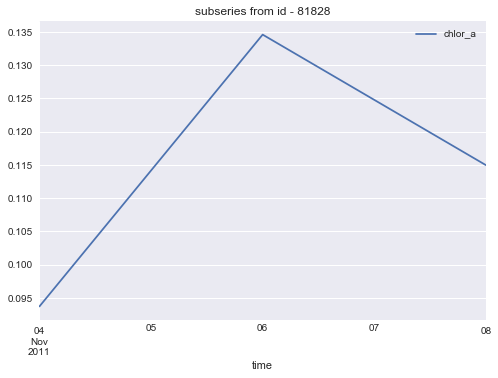

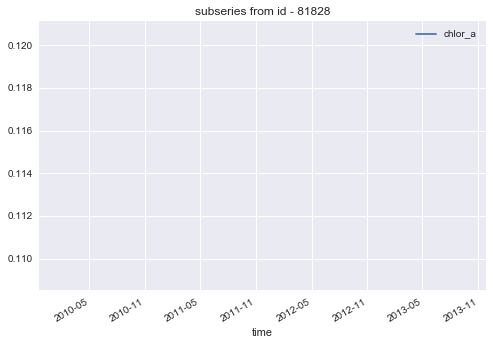

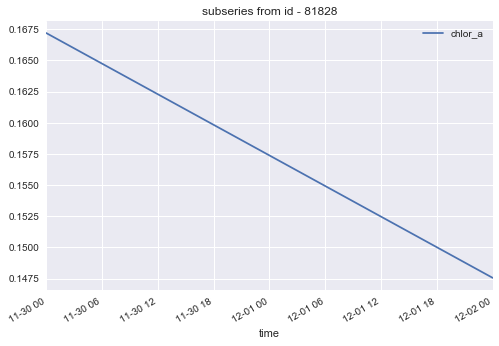

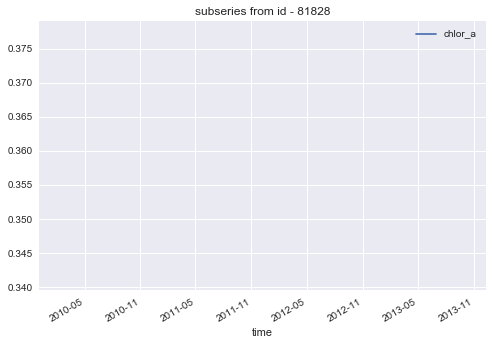

In [11]:
# solution of case 2   -- test case
# chang float id, whenever a new subfloat is generated

# necessary for selection
floatsDF_NovMar_ID.time = pd.to_datetime(floatsDF_NovMar_ID.time) 

from datetime import timedelta
# temp kept, but is not touched, to be dropped
col_listLDS = ['time', 'id', 'lat', 'lon', 'temp', 've', 'vn', 'spd', 
               'chlor_a', 'dist', 'cdm', 'kd490', 't865',
               'par', 'sst4']

# temp kept, but is not touched, to be dropped
col_listLDS_subset = ['ve', 'vn', 'spd',
                      'chlor_a', 'dist', 'cdm', 'kd490', 't865',
                      'par', 'sst4']


# test case 1:
# float id == 71140
# nan's ratio: 0.5
# split series and series end with two good values 
#floatsDF_81828 = floatsDF_NovMar_ID[floatsDF_NovMar_ID.id == 71140]

# test case 3:
# float id == 81828, 
# nan's ratio: 0.61, choose threshold 0.62
# series no need to split
# floatsDF_81828 = floatsDF_NovMar_ID[floatsDF_NovMar_ID.id == 81828]

# test case 2:
# float id == 81828, 
# nan's ratio: 0.61, choose threshold 0.47
# split series and series end with one good values

floatsDF_sub_list = []

floatsDF_81828 = floatsDF_NovMar_ID[floatsDF_NovMar_ID.id == 81828]
print(floatsDF_81828.set_index("time").chlor_a)
print('first valid index:', floatsDF_81828.set_index("time").chlor_a.first_valid_index())
print('last valid index:',floatsDF_81828.set_index("time").chlor_a.last_valid_index())
# drop everything outside this range
head = floatsDF_81828.set_index("time").chlor_a.first_valid_index()
tail =  floatsDF_81828.set_index("time").chlor_a.last_valid_index()
mask = (floatsDF_81828.time >= head) & (floatsDF_81828.time <= tail)
floatsDF_81828 = floatsDF_81828[mask]
print("-----\n head and tail of the nonnan series are identified \n")
print(floatsDF_81828.set_index("time").chlor_a)

# calculate the ratio of nans in the trimmed chlor_a series
length = len(floatsDF_81828.chlor_a)
print("length is", length)
ratio = floatsDF_81828.chlor_a.isnull().sum()/length
print("the float id is:", floatsDF_81828.id.values[0])
print("the ratio of nans in the trimmed chlor_a series", ratio)


# if nan's ratio is less than 0.47, then we interpolate the values in between
if ratio <= 0.47:
    # df.interpolate()
    print(floatsDF_81828['chlor_a'].interpolate(method='linear', axis=0, 
                                                limit=None, inplace=True))
    #floatsDF_81828['chlor_a'].interpolate(method='linear', axis=0, limit=None, 
    #inplace=False).plot()
    floatsDF_81828.plot(x='time', y ='chlor_a', title=('id - %d' % 81828))
    print(floatsDF_81828[col_listLDS ])
    ### process all other variables, here we assume other variable are linear...
    # + easy approach: linear interpolation, then fill forward, then fill backward
    # + more dedicated approach: check ratio of each variables
    print("the easy approach: linear interpolation on other var, then ffill, then bfill")
    #this oneliner doesnot work:
    #floatsDF_81828[col_listLDS_subset].interpolate(method='linear', axis=0, 
    #limit=None, inplace=True)
    for col in col_listLDS_subset:
        floatsDF_81828[col].interpolate(method='linear', axis=0, limit=None, inplace=True)
    floatsDF_81828[col_listLDS_subset].fillna(method='ffill')
    floatsDF_81828[col_listLDS_subset].fillna(method='bfill')
    print("------ after preprocess completed ------")
    print("------ after preprocess completed ------")
    print("------ after preprocess completed ------")
    print(floatsDF_81828[col_listLDS ])
    # collect
    floatsDF_sub_list.append(floatsDF_81828) 
    
    
# if nan's ratio is bigger than 0.47, then we split the series as continuous sub-series
# while loop
if ratio > 0.47:
    # loop through the time
    # https://stackoverflow.com/questions/16782682/timedelta-is-not-defined
    
    # task: collect all the contiguous subsequences in the time series
    # + use time t to loop through the series
    # + start with subhead = t
    # + use flag = 1 to indicate that an subtail is expected
    # + condition branched on whether chlor_a at time t is nan
   
    
    print("head is", head)
    t = head
    print("t is", t)
    flag = 1     # subtail is expected
    subhead = t  # start with a good value

    while (t <= tail ):
        bool_array = floatsDF_81828[floatsDF_81828.time== t].chlor_a.isnull()
        
        if len(bool_array)==0: # there are gaps in data!!!! supposed to be a length 1 array
            detect_nan = True # end of series reached, since there is a gap in data!!!!
        else:
            detect_nan = bool_array.values[0]
        
        if (1 == flag) & (~detect_nan):
            if (tail == t): # end of series reached
                flag = 10000
                subtail = t # end of series reached
                mask = (floatsDF_81828.time >= subhead) & (floatsDF_81828.time <= subtail) 
                tmp = floatsDF_81828[mask]
                tmp.plot(x='time', y ='chlor_a', title=('subseries from id - %d' % 81828))
                floatsDF_sub_list.append(tmp)
            else: 
                pass
        
        if (1 == flag) & (detect_nan):
            flag = 0 
            subtail = t - timedelta(freq)
            # id need to be added with increment
            mask = (floatsDF_81828.time >= subhead) & (floatsDF_81828.time <= subtail) 
            tmp = floatsDF_81828[mask]
            tmp.plot(x='time', y ='chlor_a', title=('subseries from id - %d' % 81828))
            floatsDF_sub_list.append(tmp)
            
        if (0 == flag) & (detect_nan ):
            pass
        
        if (0 == flag) & (~detect_nan):
            if (tail == t): # end of series reached
                flag = 10000
                subhead = t
                subtail = t
                mask = (floatsDF_81828.time >= subhead) & (floatsDF_81828.time <= subtail) 
                tmp = floatsDF_81828[mask]
                tmp.plot(x='time', y ='chlor_a', title=('subseries from id - %d' % 81828))
                print("yoyo")
                floatsDF_sub_list.append(tmp)
            else:          # end of series not reached
                flag = 1
                subhead = t
        
        t = t + timedelta(freq) # increment on t
    
    print("now t is", t)
    
floatsDF_list = pd.concat(floatsDF_sub_list)
print(floatsDF_list)
    
    

# need a new dataframe to store all the data


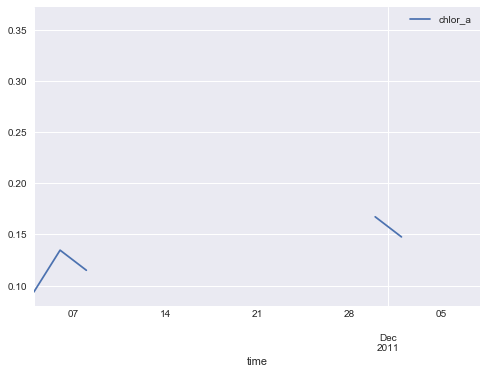

In [12]:
floatsDF_81828.plot(x='time',y='chlor_a')

In [13]:
len(floatsDF_81828[floatsDF_81828.time== t].chlor_a.isnull())

0

-----
 head and tail of the nonnan series are identified 

the float id is: 10206.0
the ratio of nans in the trimmed chlor_a series 0.177777777778
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after preprocess completed ------
-----
 head and tail of the nonnan series are identified 

the float id is: 11089.0
the ratio of nans in the trimmed chlor_a series 0.0540540540541
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after preprocess completed ------
-----
 head and tail of the nonnan series are identified 

the float id is: 15707.0
the ratio of nans in the trimmed chlor_a series 0.24
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ af

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after preprocess completed ------
-----
 head and tail of the nonnan series are identified 

the float id is: 53352.0
the ratio of nans in the trimmed chlor_a series 0.0
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after preprocess completed ------
-----
 head and tail of the nonnan series are identified 

the float id is: 57939.0
the ratio of nans in the trimmed chlor_a series 0.0
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after preprocess completed ------
-----
 head and tail of the nonnan series are identified 

the float id is: 57940.0
the ratio of nans in the trimmed chlor_a ser

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/pandas/core/indexing.py:476: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=733105.0, right=733105.0
  'left=%s, right=%s') % (left, right))
/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=733115.0, right=733115.0
  'left=%s, right=%s') % (left, right))
/Users/vya

-----
 head and tail of the nonnan series are identified 

the float id is: 71141.0
the ratio of nans in the trimmed chlor_a series 0.384615384615
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after preprocess completed ------
-----
 head and tail of the nonnan series are identified 

the float id is: 71142.0
the ratio of nans in the trimmed chlor_a series 0.4
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after preprocess completed ------
-----
 head and tail of the nonnan series are identified 

the float id is: 59213.05
the ratio of nans in the trimmed chlor_a series 0.333333333333
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ aft

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=734463.0, right=734463.0
  'left=%s, right=%s') % (left, right))
/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=734479.0, right=734479.0
  'left=%s, right=%s') % (left, right))



t is 2011-11-04 00:00:00
-----
 head and tail of the nonnan series are identified 

the float id is: 88652.0
the ratio of nans in the trimmed chlor_a series 0.309523809524
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after preprocess completed ------
-----
 head and tail of the nonnan series are identified 

the float id is: 88671.0
the ratio of nans in the trimmed chlor_a series 0.178082191781
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after preprocess completed ------
-----
 head and tail of the nonnan series are identified 

the float id is: 54038.0
the ratio of nans in the trimmed chlor_a series 0.107692307692
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after pr

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=735323.0, right=735323.0
  'left=%s, right=%s') % (left, right))
/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=735545.0, right=735545.0
  'left=%s, right=%s') % (left, right))
/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=735549.0, right=735549.0
  'left=%s, right=%s') % (left, right))


-----
 head and tail of the nonnan series are identified 

the float id is: 60947960.0
the ratio of nans in the trimmed chlor_a series 0.0
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after preprocess completed ------
-----
 head and tail of the nonnan series are identified 

the float id is: 109290.0
the ratio of nans in the trimmed chlor_a series 0.461538461538
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after preprocess completed ------
-----
 head and tail of the nonnan series are identified 

the float id is: 114553.0
the ratio of nans in the trimmed chlor_a series 0.34
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after pre

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=736401.0, right=736401.0
  'left=%s, right=%s') % (left, right))
/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=736419.0, right=736419.0
  'left=%s, right=%s') % (left, right))


2017-03-07 00:00:00
-----
 head and tail of the nonnan series are identified 

the float id is: 63258950.0
the ratio of nans in the trimmed chlor_a series 0.142857142857
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after preprocess completed ------
-----
 head and tail of the nonnan series are identified 

the float id is: 63259180.0
the ratio of nans in the trimmed chlor_a series 0.428571428571
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after preprocess completed ------
------ after preprocess completed ------
-----
 head and tail of the nonnan series are identified 

the float id is: 63259190.0
the ratio of nans in the trimmed chlor_a series 0.142857142857
the easy approach: linear interpolation on other var, then ffill, then bfill
------ after preprocess completed ------
------ after

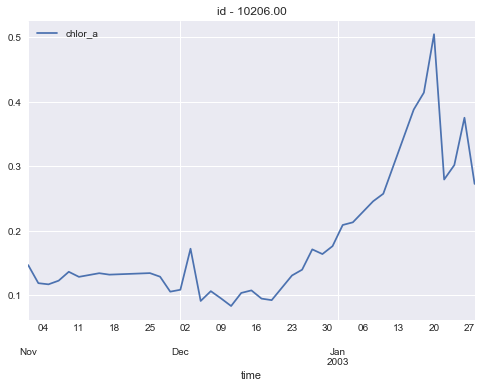

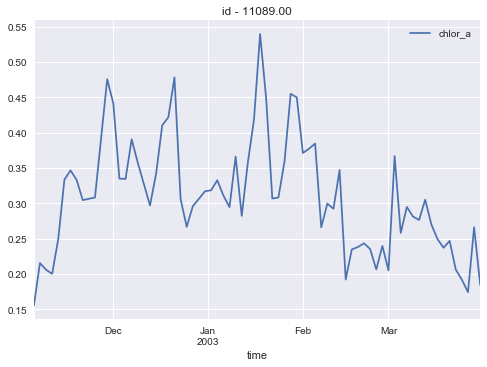

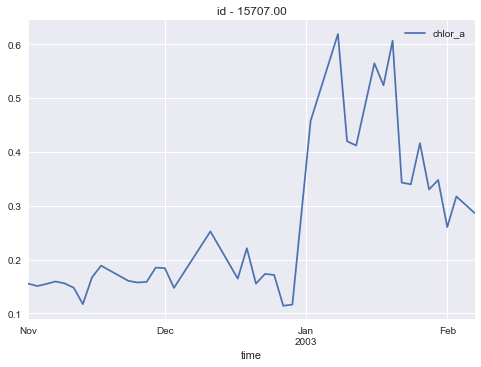

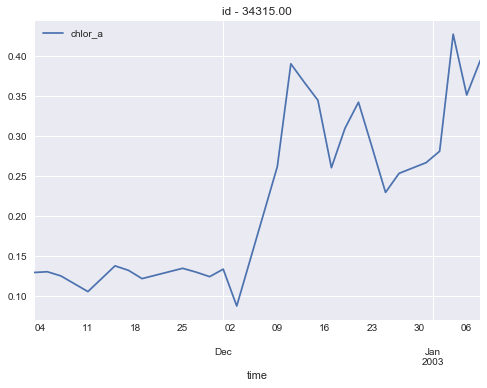

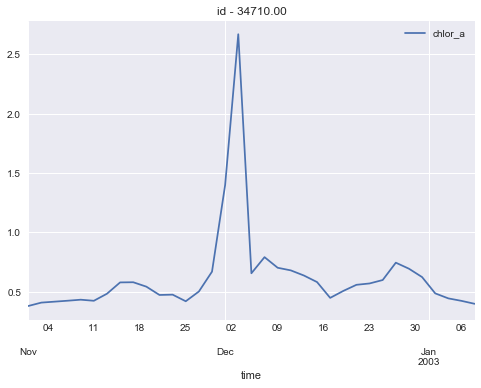

...

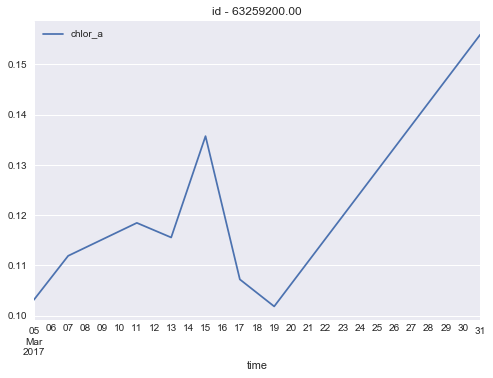

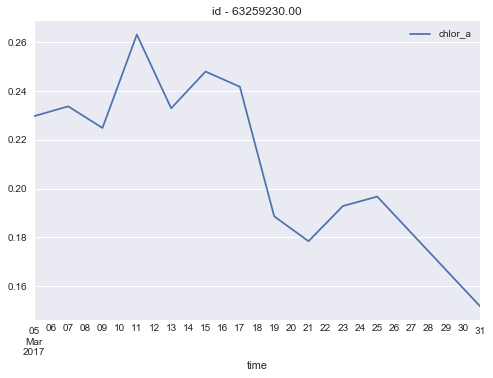

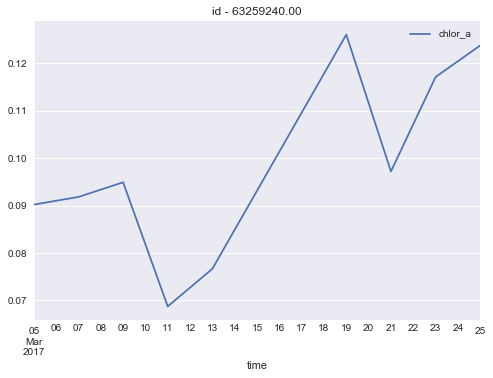

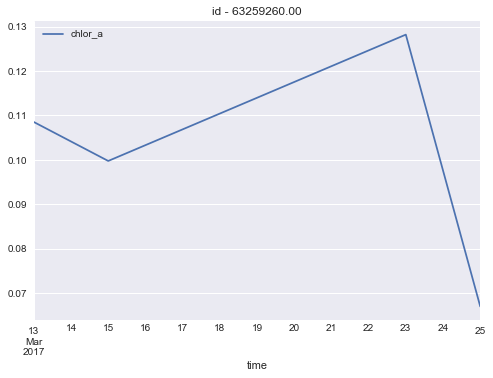

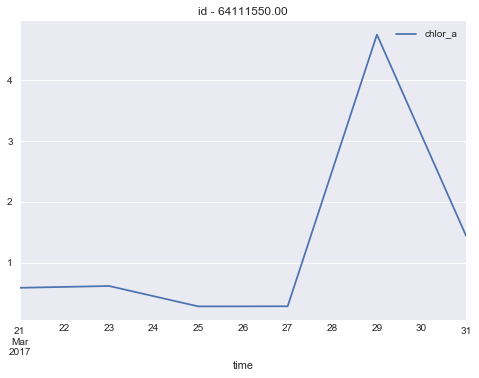

In [14]:
# solution of case 2   -- general case
# chang float id, whenever a new subfloat is generated
# some float ids are removed in case 1

floatsDF_list = float_preprocessing.floatIdInterpolationOrSplitting(floatsDF_NovMar_ID, freq)
print(floatsDF_list)

In [15]:
print(["{0:0.2f}".format(i) for i in floatsDF_list.id.unique()]  ) 

['10206.00', '11089.00', '15707.00', '34315.00', '34710.00', '34721.00', '34709.00', '27139.00', '36530.00', '34223.00', '27139.05', '43744.00', '43746.00', '43748.00', '43995.00', '53363.00', '53365.00', '53366.00', '53367.00', '46472.00', '54371.00', '53352.00', '57939.00', '57940.00', '59371.00', '59372.00', '59373.00', '43598.00', '62201.00', '62202.00', '62556.00', '62557.00', '62558.00', '62555.00', '62198.00', '63036.00', '62195.00', '62193.00', '62553.00', '59365.00', '59367.00', '70697.00', '70699.00', '59363.00', '70695.00', '63068.00', '63069.00', '63071.00', '63074.00', '63075.00', '63076.00', '63928.00', '63929.00', '63935.00', '63930.00', '59369.00', '59368.00', '40273.00', '72634.00', '73077.00', '72633.00', '73076.00', '75142.00', '72638.00', '71160.00', '59213.00', '59215.00', '59394.00', '71158.00', '71159.00', '71162.00', '73079.00', '71161.00', '45748.00', '71138.00', '75137.00', '75138.00', '75141.00', '71139.00', '71140.03', '71140.06', '71140.09', '71140.12', '71

In [16]:
# reuse solution of case 1
# remove any series with 0 or 1 non-nan values
id_set4 = floatsDF_list.id.unique()
for i in id_set4:
    if floatsDF_list[floatsDF_list.id == i].chlor_a.count() < 2:
        floatsDF_list = floatsDF_list[floatsDF_list.id != i] 

# verify the float id
print(["{0:0.2f}".format(i) for i in floatsDF_list.id.unique()]  ) 

['10206.00', '11089.00', '15707.00', '34315.00', '34710.00', '34721.00', '34709.00', '27139.00', '36530.00', '34223.00', '27139.05', '43744.00', '43746.00', '43748.00', '43995.00', '53363.00', '53365.00', '53366.00', '53367.00', '46472.00', '54371.00', '53352.00', '57939.00', '57940.00', '59371.00', '59372.00', '59373.00', '43598.00', '62201.00', '62202.00', '62556.00', '62557.00', '62558.00', '62555.00', '62198.00', '63036.00', '62195.00', '62193.00', '62553.00', '59365.00', '59367.00', '70697.00', '70699.00', '59363.00', '70695.00', '63068.00', '63069.00', '63071.00', '63074.00', '63075.00', '63076.00', '63928.00', '63929.00', '63935.00', '63930.00', '59369.00', '59368.00', '40273.00', '72634.00', '73077.00', '72633.00', '73076.00', '75142.00', '72638.00', '71160.00', '59213.00', '59215.00', '59394.00', '71158.00', '71159.00', '71162.00', '73079.00', '71161.00', '45748.00', '71138.00', '75137.00', '75138.00', '75141.00', '71139.00', '71140.06', '71140.15', '71141.00', '71142.00', '59

In [17]:
floatsDF_list

,time,id,lat,lon,temp,ve,vn,spd,var_lat,var_lon,...,sst4,chlor_a_log_e,chl_rate,chl_log_e_rate,chl_rate_week,chl_log_e_rate_week,chl_rate_stand,chl_log_e_rate_stand,week,week_rotate
907,2002-11-01,10206.0,10.737250,67.512250,NaN,-4.832250,6.374250,9.069875,0.000272,0.000719,...,29.292499,-1.921645,-0.005333,-0.035171,-0.037333,-0.246199,-0.011023,-0.138664,44,1
913,2002-11-03,10206.0,10.818500,67.399375,NaN,-8.207500,7.311375,12.395125,0.000295,0.000778,...,28.825901,-2.134598,-0.014037,-0.106476,-0.098258,-0.745333,-0.020329,-0.499421,44,1
919,2002-11-05,10206.0,10.902250,67.291000,NaN,-7.410625,5.807000,11.830125,0.000666,0.002068,...,29.225624,-2.149920,-0.000899,-0.007661,-0.006295,-0.053627,-0.006283,0.000520,45,2
925,2002-11-07,10206.0,11.036625,67.202125,NaN,-6.844125,6.546875,11.460500,0.000174,0.000420,...,29.025417,-2.102331,0.002839,0.023795,0.019873,0.166562,-0.002286,0.159665,45,2
931,2002-11-09,10206.0,11.130625,67.113250,NaN,-0.825125,4.402625,5.688125,0.000866,0.002828,...,28.841013,-1.995330,0.006899,0.053500,0.048291,0.374501,0.002055,0.309956,45,2
937,2002-11-11,10206.0,11.153750,67.132250,NaN,0.870375,0.028125,1.862250,0.000387,0.001112,...,29.428974,-2.054857,-0.003929,-0.029763,-0.027502,-0.208344,-0.009522,-0.111304,46,3
943,2002-11-13,10206.0,11.153250,67.105875,NaN,-3.435000,2.077500,4.831750,0.000329,0.000949,...,27.924999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,46,3
949,2002-11-15,10206.0,11.185250,67.081500,NaN,0.244250,-0.256875,1.330125,0.002355,0.009313,...,28.576249,-2.011518,NaN,NaN,NaN,NaN,NaN,NaN,46,3
956,2002-11-17,10206.0,11.164500,67.069250,NaN,-3.124000,-1.477125,3.740125,0.001855,0.007247,...,28.584751,-2.028385,-0.001119,-0.008434,-0.007832,-0.059037,-0.006517,-0.003390,46,3
962,2002-11-19,10206.0,11.160625,67.019250,NaN,-1.637375,0.933125,3.259750,0.000123,0.000269,...,28.579999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47,4


In [18]:
# at the end, just check the data quality of other variables
# check nan values in the spatial-temporal info
print("---------------------------------------")
print("sampling freq: "+ str(freq) + "D")
print("length of series: ", len(floatsDF_list.chlor_a))
print("---------------------------------------")
cols = floatsDF_list.columns.values
for col in cols:
    print("count of nans in " + col + ":" + str(floatsDF_list[col].isnull().sum()) )

---------------------------------------
sampling freq: 2D
length of series:  5597
---------------------------------------
count of nans in time:0
count of nans in id:0
count of nans in lat:0
count of nans in lon:0
count of nans in temp:310
count of nans in ve:14
count of nans in vn:14
count of nans in spd:14
count of nans in var_lat:0
count of nans in var_lon:0
count of nans in var_tmp:0
count of nans in chlor_a:0
count of nans in dist:0
count of nans in cdm:21
count of nans in kd490:0
count of nans in t865:1
count of nans in par:0
count of nans in sst4:14
count of nans in chlor_a_log_e:955
count of nans in chl_rate:1669
count of nans in chl_log_e_rate:1669
count of nans in chl_rate_week:1669
count of nans in chl_log_e_rate_week:1669
count of nans in chl_rate_stand:1669
count of nans in chl_log_e_rate_stand:1669
count of nans in week:0
count of nans in week_rotate:0


In [19]:
# drop uncessary variables and fill in nan using mean values
col_listLDS_final = ['time', 'id', 'lat', 'lon',  've', 'vn', 'spd', 
               'chlor_a', 'dist', 'cdm', 'kd490', 't865',
               'par', 'sst4']
floatsDF_list_final = floatsDF_list[col_listLDS_final]
for col in col_listLDS_final:
    print("count of nans in " + col + ":" + str(floatsDF_list_final[col].isnull().sum()) )

# fill in the mean()
print("--- printing the mean --- ")
print(floatsDF_list_final.mean())
print("--- filling the mean ---")
# https://stackoverflow.com/questions/18689823/pandas-dataframe-replace-nan-values-with-average-of-columns
floatsDF_list_final.fillna(floatsDF_list_final.mean(), inplace=True)

# recheck the quality
for col in col_listLDS_final:
    print("count of nans in " + col + ":" + str(floatsDF_list_final[col].isnull().sum()) )
    
# save the data and printout
print(floatsDF_list_final)
outpath = "../data/" + "floatsDF_list_final_" + "LDS_"+ str(freq) + "d.csv"
floatsDF_list_final.to_csv(outpath, sep=',')
test = pd.read_csv(outpath)
print("------------------")
print("------------------")
print("------------------")
print(test)   


count of nans in time:0
count of nans in id:0
count of nans in lat:0
count of nans in lon:0
count of nans in ve:14
count of nans in vn:14
count of nans in spd:14
count of nans in chlor_a:0
count of nans in dist:0
count of nans in cdm:21
count of nans in kd490:0
count of nans in t865:1
count of nans in par:0
count of nans in sst4:14
--- printing the mean --- 
id         1.177368e+07
lat        1.298380e+01
lon        6.249435e+01
ve        -5.457326e+00
vn         1.992200e+00
spd        2.708093e+01
chlor_a    8.169323e-01
dist       4.196904e+02
cdm        4.102378e-02
kd490      8.716926e-02
t865       1.371765e-01
par        4.585217e+01
sst4       2.678107e+01
dtype: float64
--- filling the mean ---


/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/pandas/core/generic.py:3295: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)


count of nans in time:0
count of nans in id:0
count of nans in lat:0
count of nans in lon:0
count of nans in ve:0
count of nans in vn:0
count of nans in spd:0
count of nans in chlor_a:0
count of nans in dist:0
count of nans in cdm:0
count of nans in kd490:0
count of nans in t865:0
count of nans in par:0
count of nans in sst4:0
            time          id        lat        lon         ve         vn  \
907   2002-11-01     10206.0  10.737250  67.512250  -4.832250   6.374250   
913   2002-11-03     10206.0  10.818500  67.399375  -8.207500   7.311375   
919   2002-11-05     10206.0  10.902250  67.291000  -7.410625   5.807000   
925   2002-11-07     10206.0  11.036625  67.202125  -6.844125   6.546875   
931   2002-11-09     10206.0  11.130625  67.113250  -0.825125   4.402625   
937   2002-11-11     10206.0  11.153750  67.132250   0.870375   0.028125   
943   2002-11-13     10206.0  11.153250  67.105875  -3.435000   2.077500   
949   2002-11-15     10206.0  11.185250  67.081500   0.244250  


 ------ chl-a plots for each float ------ 



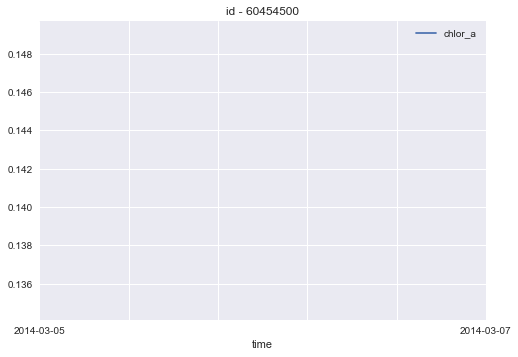

# of non-nan in the series is 1
the series of chlor_a is: 
 9999     0.141918
10009         NaN
Name: chlor_a, dtype: float64


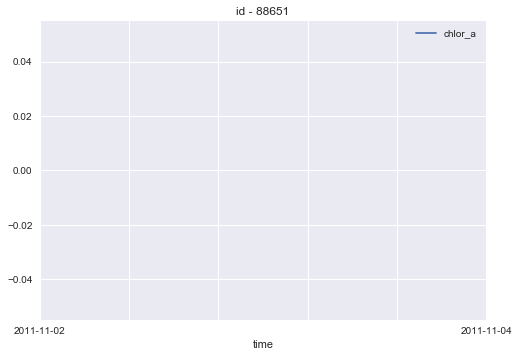

# of non-nan in the series is 0
the series of chlor_a is: 
 8866   NaN
8870   NaN
Name: chlor_a, dtype: float64


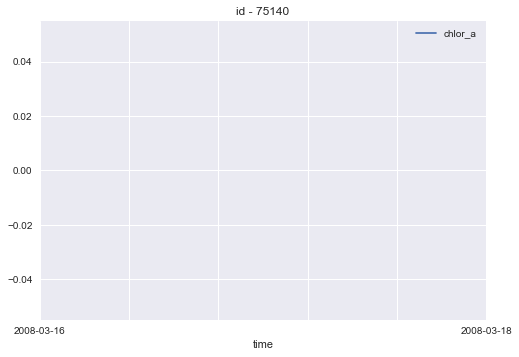

# of non-nan in the series is 0
the series of chlor_a is: 
 5187   NaN
5210   NaN
Name: chlor_a, dtype: float64


/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.0, right=0.0
  'left=%s, right=%s') % (left, right))


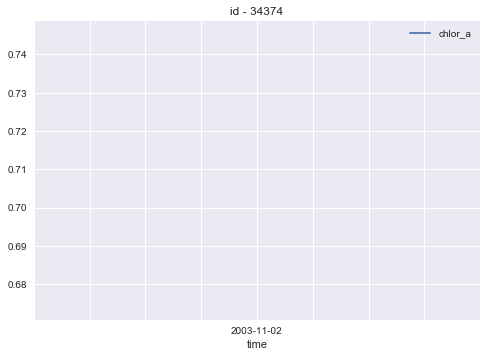

# of non-nan in the series is 1
the series of chlor_a is: 
 1529    0.709717
Name: chlor_a, dtype: float64


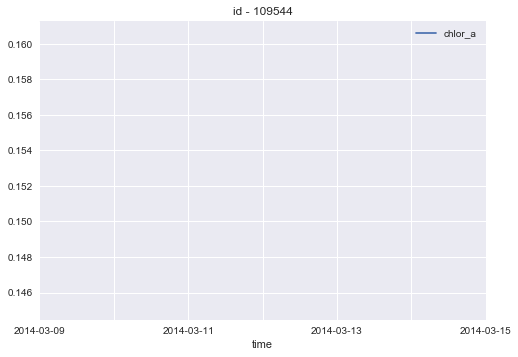

# of non-nan in the series is 1
the series of chlor_a is: 
 10016         NaN
10025         NaN
10034    0.152878
10043         NaN
Name: chlor_a, dtype: float64


In [229]:
# case 1
# plot a few specific floats
### chl-a plots for each float ###
### case 1. series with 0 or 1 non-nan values
print("\n ------ chl-a plots for each float ------ \n")
id_set_check = [60454500, 88651, 75140, 34374, 109544,]
plt.figure(figsize=(8,6))
for i in id_set_check:
    floatsDF_NovMar_ID[floatsDF_NovMar_ID.id == i].plot(x='time', y ='chlor_a', title=('id - %d' % i) )
    plt.show();
    print("# of non-nan in the series is", floatsDF_NovMar_ID[floatsDF_NovMar_ID.id == i].chlor_a.count())
    print("the series of chlor_a is: \n", floatsDF_NovMar_ID[floatsDF_NovMar_ID.id == i].chlor_a)
plt.close("all")



 ------ chl-a plots for each float ------ 



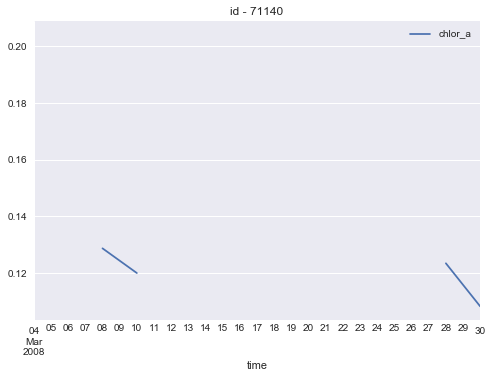

# of non-nan in the series is 7
the series of chlor_a is: 
 5032    0.125782
5055         NaN
5080    0.128777
5105    0.120073
5129         NaN
5152    0.109144
5175         NaN
5198         NaN
5221         NaN
5242    0.204107
5262         NaN
5282         NaN
5302    0.123508
5322    0.108311
Name: chlor_a, dtype: float64


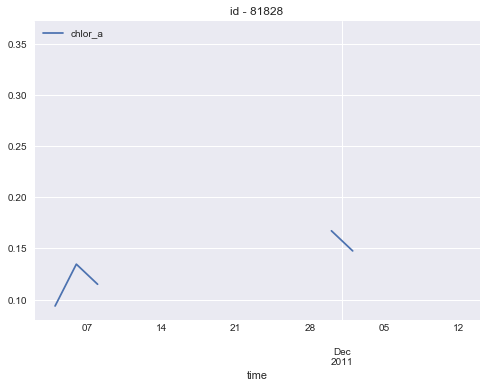

# of non-nan in the series is 7
the series of chlor_a is: 
 8865         NaN
8869    0.093718
8873    0.134595
8876    0.114970
8879         NaN
8882         NaN
8885         NaN
8888         NaN
8891         NaN
8894         NaN
8898    0.114817
8902         NaN
8907         NaN
8911         NaN
8915    0.167198
8919    0.147555
8923         NaN
8927         NaN
8931    0.359275
8935         NaN
8940         NaN
8946         NaN
Name: chlor_a, dtype: float64


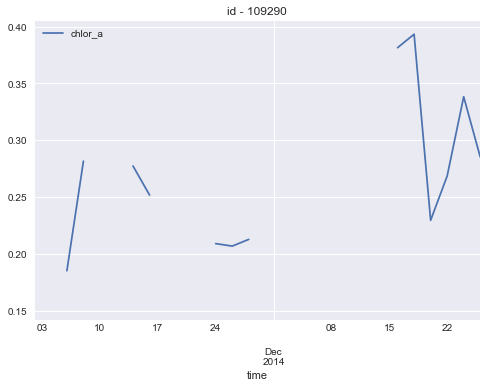

# of non-nan in the series is 14
the series of chlor_a is: 
 12394         NaN
12408         NaN
12420    0.185147
12432    0.281564
12444         NaN
12456         NaN
12469    0.277327
12481    0.251755
12493         NaN
12506    0.154073
12518         NaN
12530    0.209007
12543    0.206814
12556    0.212726
12569         NaN
12581         NaN
12592         NaN
12603         NaN
12614         NaN
12625         NaN
12636         NaN
12646         NaN
12656    0.381456
12666    0.393336
12676    0.229503
12686    0.268488
12696    0.338313
12706    0.285244
Name: chlor_a, dtype: float64


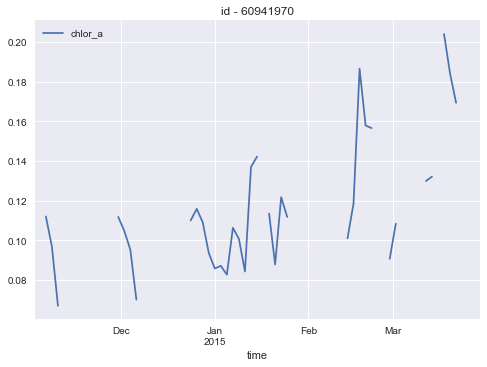

# of non-nan in the series is 39
the series of chlor_a is: 
 12406         NaN
12418         NaN
12430    0.112091
12442    0.096905
12454    0.067116
12466         NaN
12478         NaN
12490         NaN
12503         NaN
12515    0.123540
12527         NaN
12540    0.111901
12553         NaN
12566         NaN
12578    0.111851
12589    0.104790
12600    0.095366
12611    0.070245
12622         NaN
12633         NaN
12644         NaN
12654         NaN
12664         NaN
12674         NaN
12684         NaN
12694         NaN
12704    0.110076
12714    0.115920
12723    0.109167
12732    0.093755
           ...   
12884         NaN
12893         NaN
12902         NaN
12910         NaN
12918    0.134519
12925         NaN
12932         NaN
12939    0.101137
12946    0.118631
12953    0.186502
12959    0.157899
12965    0.156572
12971         NaN
12977         NaN
12983    0.090796
12989    0.108428
12994         NaN
12999         NaN
13004         NaN
13009         NaN
13014    0.129958
130

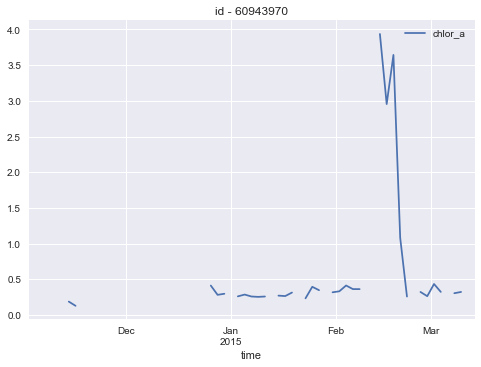

# of non-nan in the series is 37
the series of chlor_a is: 
 12407         NaN
12419         NaN
12431    0.147176
12443         NaN
12455         NaN
12467         NaN
12479    0.185631
12491    0.126684
12504         NaN
12516         NaN
12528         NaN
12541    0.159312
12554         NaN
12567         NaN
12579    0.159794
12590         NaN
12601         NaN
12612         NaN
12623         NaN
12634         NaN
12645         NaN
12655    0.181951
12665         NaN
12675         NaN
12685         NaN
12695         NaN
12705         NaN
12715    0.410534
12724    0.280412
12733    0.295644
           ...   
12812    0.269477
12822    0.263150
12831    0.312512
12840         NaN
12849    0.231620
12858    0.393240
12867    0.345696
12876         NaN
12885    0.315968
12894    0.330025
12903    0.411387
12911    0.361188
12919    0.360795
12926         NaN
12933         NaN
12940    3.936733
12947    2.954455
12954    3.643833
12960    1.079364
12966    0.256784
12972         NaN
129

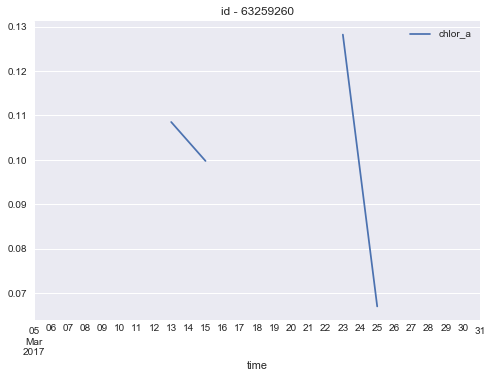

# of non-nan in the series is 4
the series of chlor_a is: 
 15323         NaN
15351         NaN
15379         NaN
15407         NaN
15435    0.108533
15462    0.099769
15489         NaN
15516         NaN
15542         NaN
15569    0.128200
15595    0.067038
15621         NaN
15648         NaN
15675         NaN
Name: chlor_a, dtype: float64


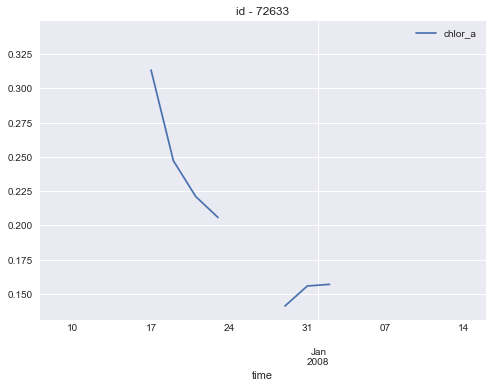

# of non-nan in the series is 8
the series of chlor_a is: 
 4508         NaN
4520         NaN
4533         NaN
4546    0.339569
4559         NaN
4572    0.313388
4585    0.247217
4598    0.221103
4611    0.205743
4622         NaN
4634         NaN
4646    0.141126
4658    0.155738
4670    0.156944
4681         NaN
4692         NaN
4703         NaN
4714         NaN
4725         NaN
4736         NaN
4747         NaN
Name: chlor_a, dtype: float64


In [233]:
# case 2
# plot a few specific floats
### chl-a plots for each float ###
### case 2. xxxxx
print("\n ------ chl-a plots for each float ------ \n")
id_set_check2 = [71140, 81828, 109290,
                 60941970, 60943970, 63259260, 72633]
# how to remove series like this 

plt.figure(figsize=(8,6))
for i in id_set_check2:
    floatsDF_NovMar_ID[floatsDF_NovMar_ID.id == i].plot(x='time', y ='chlor_a', title=('id - %d' % i) )
    plt.show();
    print("# of non-nan in the series is", floatsDF_NovMar[floatsDF_NovMar_ID.id == i].chlor_a.count())
    print("the series of chlor_a is: \n", floatsDF_NovMar[floatsDF_NovMar_ID.id == i].chlor_a)

plt.close("all")

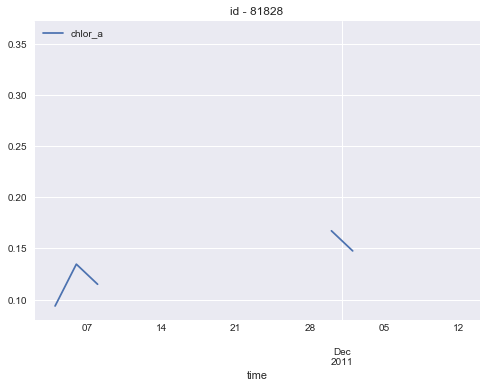

In [234]:
#locate the first and last non NAN values in a Pandas DataFrame
plt.figure(figsize=(8,6))
floatsDF_NovMar_ID[floatsDF_NovMar_ID.id == 81828].plot(x='time', y ='chlor_a', title=('id - %d' % 81828) )
plt.show();
plt.close("all");

